This notebook explores using classification accuracy on monthly composites and all available dates.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import json
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import numpy as np
from tqdm.notebook import tqdm
from itertools import product

In [3]:
from sklearn import metrics
from sklearn.model_selection import KFold
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier

# Datasets
This notebook has random sampling of reference points.
The lightgbm is trained on all data and tested on the selected raw cloud free dates and all raw dates.

In [4]:
name_map = {'Larix decidua': 0,
 'Pinus sylvestris': 1,
 'Broadleaved trees': 2,
 'Picea abies': 3,
 'Pinus mugo': 4,
 'Pinus cembra': 5,
 'Abies alba': 6}
 # reverse the dictionary
value_map = {v: k for k, v in name_map.items()}

In [5]:
# load all features
bands = ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B11', 'B12', 'ndvi']
years = ["2018", "2019", "2020", "2021", "2022", "2023", "2024"] # "2017",
DATA_PATH = "data/csv/ml_ts/"
files = ["_raw.csv", "_syn_raw.csv", "_sg.csv"]  #  "_syn.csv", 
data_names = [x[1:].split(".")[0] for x in files]

In [15]:
# test on raw
results = {}
for i in tqdm(range(5)):
    for year in years:
        yearly_results = {}    
        kf = KFold(n_splits=5, shuffle=True)
        org_df = pd.read_csv(DATA_PATH+year+"_raw.csv", index_col=0, low_memory=False)
        org_df.columns = ["band", "date", *[int(x) for x in org_df.columns[2:]]]
        org_df = org_df.drop("class")
        org_df.date = pd.to_datetime(org_df.date)
        org_df = org_df.groupby(["band","date"]).mean()
        for f1 in [ "_raw.csv", "_syn_raw.csv"]:
            for j, (train_index, test_index) in enumerate(kf.split(org_df.T[2:])): 
                # run training
                df = pd.read_csv(DATA_PATH+year+f1, index_col=0, low_memory=False)

                df.columns = ["band", "date", *[int(x) for x in df.columns[2:]]]
                y = df.T.pop("class")[2:].astype(int)
                y_test = y[test_index]
                y_train = y[train_index]
                df = df.drop("class")

                df.date = pd.to_datetime(df.date)
                y_train_unique = np.unique(y)
                df = df.groupby(["band","date"]).mean()
                df = df.loc[bands]
                #df.drop("date", axis=1, inplace=True)
                #train test split, remove points with nan values
                sorted_dates = df.isna().sum(axis=1).sort_values().index
                train_df[train_df.isna()]=0
                
                test_df = org_df.loc[:, test_index]
                train_df = df.loc[test_df.index, train_index]
                # Set up the LightGBM model
                model_lgbm = lgb.LGBMClassifier(
                    objective='multiclass', 
                    num_class=len(y_train_unique), 
                    metric='multi_logloss'
                )
                # Train the model
                model_lgbm.fit(train_df.T.values, y_train.values)
                # test lightgbm
                y_pred = model_lgbm.predict(test_df.T)
                acc = 100 * metrics.accuracy_score(y_test, y_pred)
                f1_w = 100 * metrics.f1_score(y_test, y_pred, average='weighted')
                yearly_results[f1.split(".")[0]+"_lgbm_"+str(i)+"_"+str(j)] = [acc, f1_w]
                # RF
                train_df[train_df.isna()]=0
                test_df[test_df.isna()]=0
                model_rf = RandomForestClassifier(n_estimators=1000)
                model_rf.fit(train_df.T.values, y_train.values)
                y_pred_rf = model_rf.predict(test_df.T.values)
                acc_rf = 100 * metrics.accuracy_score(y_test, y_pred_rf)
                f1_w_rf = 100 * metrics.f1_score(y_test, y_pred_rf, average='weighted')
                yearly_results[f1[1:].split(".")[0]+"_rf_"+str(i)+"_"+str(j)] = [acc_rf, f1_w_rf]
                
        results[year+"_"+str(i)]= yearly_results.copy()   

  0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 94928
[LightGBM] [Info] Number of data points in the train set: 1034, number of used features: 1066
[LightGBM] [Info] Start training from score -1.957583
[LightGBM] [Info] Start training from score -2.534471
[LightGBM] [Info] Start training from score -1.584604
[LightGBM] [Info] Start training from score -1.016934
[LightGBM] [Info] Start training from score -2.277751
[LightGBM] [Info] Start training from score -2.830316
[LightGBM] [Info] Start training from score -2.970898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

In [16]:
file_path = 'rf_lgbm_test_raw_results.json'

# Save the dictionary to a JSON file
with open(file_path, 'w') as json_file:
    json.dump(results, json_file)  

In [36]:
file_path = 'rf_lgbm_test_raw_results.json'

with open(file_path, 'r') as json_file:
    results = json.load(json_file)

In [17]:
data = []
for year, algorithms in results.items():
    for algo, res_metrics in algorithms.items():
        # Split the algorithm name to extract test set, repeat, and fold
        parts = algo.split('_')
        if len(parts) == 6:
            parts = parts[1:]
            merged = parts[0] + parts[1]
            parts = [merged] + parts[2:]
        elif len(parts) == 5:
            merged = parts[0] + parts[1]
            parts = [merged] + parts[2:]
        test_set = parts[0]  # The number before the first underscore is the test set
        algo_name = parts[1]
        repeat = int(parts[2])    # The number after the first underscore and before the second is the repeat
        fold = int(parts[3])      # The number after the last underscore is the fold
        
        accuracy, f1_score = res_metrics
        # Store year, test_set, repeat, fold, algorithm name, accuracy, and F1 score
        data.append([year, test_set, repeat, fold, algo_name, accuracy, f1_score])

# Step 2: Create a DataFrame from the processed data
df = pd.DataFrame(data, columns=['Year', 'TestSet', 'Repeat', 'Fold', 'AlgorithmName', 'Accuracy', 'F1_Score'])

# Step 3: Compute the average for each test set, repeat, and fold for each algorithm per year
df_avg = df.groupby(['Year', 'TestSet', 'AlgorithmName']).agg({'Accuracy': 'mean', 'F1_Score': 'mean'}).reset_index()

# Step 4: Calculate the mean per algorithm across all years
mean_scores = df_avg.groupby(['AlgorithmName', 'TestSet']).agg({'Accuracy': 'mean', 'F1_Score': 'mean'}).reset_index()

print("\nMean Scores per Algorithm (across all years):")
print(mean_scores)


Mean Scores per Algorithm (across all years):
  AlgorithmName TestSet   Accuracy   F1_Score
0          lgbm     raw  90.447475  90.380548
1          lgbm  synraw  56.830180  50.881320
2            rf     raw  88.522523  88.336863
3            rf  synraw  41.221847  26.666007


In [ ]:

Mean Scores per Algorithm (across all years):
  AlgorithmName TestSet   Accuracy   F1_Score
0          lgbm     raw  91.365754  91.292729
1          lgbm  synraw  54.918201  46.467774
2            rf     raw  89.333525  89.118765
3            rf  synraw  42.353824  28.354247

In [13]:
# test on syn_raw
results = {}
for i in tqdm(range(5)):
    for year in years:
        for f1 in ["_syn_raw.csv"]:
            for j, (train_index, test_index) in enumerate(kf.split(org_df.T[2:])): 
                # run training
                df = pd.read_csv(DATA_PATH+year+f1, index_col=0, low_memory=False)
                df.columns = ["band", "date", *[int(x) for x in df.columns[2:]]]
                y = df.T.pop("class")[2:].astype(int)
                y_test = y[test_index]
                y_train = y[train_index]
                df = df.drop("class")

                df.date = pd.to_datetime(df.date)
                y_train_unique = np.unique(y)
                df = df.groupby(["band","date"]).mean()
                df = df.loc[bands]
                #df.drop("date", axis=1, inplace=True)
                #train test split, remove points with nan values
                sorted_dates = df.isna().sum(axis=1).sort_values().index
                test_df = df.loc[:, test_index]
                train_df = df.loc[:, train_index]
                # Set up the LightGBM model
                model_lgbm = lgb.LGBMClassifier(
                    objective='multiclass', 
                    num_class=len(y_train_unique), 
                    metric='multi_logloss'
                )
                # Train the model
                model_lgbm.fit(train_df.T.values, y_train.values)
                # test lightgbm
                y_pred = model_lgbm.predict(test_df.T)
                acc = 100 * metrics.accuracy_score(y_test, y_pred)
                f1_w = 100 * metrics.f1_score(y_test, y_pred, average='weighted')
                yearly_results[f1.split(".")[0]+"_lgbm_"+str(i)+"_"+str(j)] = [acc, f1_w]
                
                # RF
                train_df[train_df.isna()]=0
                test_df[test_df.isna()]=0
                model_rf = RandomForestClassifier(n_estimators=1000)
                model_rf.fit(train_df.T.values, y_train.values)
                y_pred_rf = model_rf.predict(test_df.T.values)
                acc_rf = 100 * metrics.accuracy_score(y_test, y_pred_rf)
                f1_w_rf = 100 * metrics.f1_score(y_test, y_pred_rf, average='weighted')
                yearly_results[f1[1:].split(".")[0]+"_rf_"+str(i)+"_"+str(j)] = [acc_rf, f1_w_rf]

        results[year+"_"+str(i)]= yearly_results.copy()

file_path = 'synraw_synraw_results.json'

# Save the dictionary to a JSON file
with open(file_path, 'w') as json_file:
    json.dump(results, json_file)    

  0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.030238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 606630
[LightGBM] [Info] Number of data points in the train set: 1034, number of used features: 2379
[LightGBM] [Info] Start training from score -1.950757
[LightGBM] [Info] Start training from score -2.486843
[LightGBM] [Info] Start training from score -1.589332
[LightGBM] [Info] Start training from score -1.057868
[LightGBM] [Info] Start training from score -2.170505
[LightGBM] [Info] Start training from score -2.814056
[LightGBM] [Info] Start training from score -3.009364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [14]:
data = []
for year, algorithms in results.items():
    for algo, res_metrics in algorithms.items():
        # Split the algorithm name to extract test set, repeat, and fold
        parts = algo.split('_')
        if len(parts) == 6:
            parts = parts[1:]
            merged = parts[0] + "_" + parts[1]
            parts = [merged] + parts[2:]
        elif len(parts) == 5:
            merged = parts[0] + parts[1]
            parts = [merged] + parts[2:]
        test_set = parts[0]  # The number before the first underscore is the test set
        algo_name = parts[1]
        repeat = int(parts[2])    # The number after the first underscore and before the second is the repeat
        fold = int(parts[3])      # The number after the last underscore is the fold
        
        accuracy, f1_score = res_metrics
        # Store year, test_set, repeat, fold, algorithm name, accuracy, and F1 score
        data.append([year, test_set, repeat, fold, algo_name, accuracy, f1_score])

# Step 2: Create a DataFrame from the processed data
df = pd.DataFrame(data, columns=['Year', 'TestSet', 'Repeat', 'Fold', 'AlgorithmName', 'Accuracy', 'F1_Score'])

# Step 3: Compute the average for each test set, repeat, and fold for each algorithm per year
df_avg = df.groupby(['Year', 'TestSet', 'AlgorithmName']).agg({'Accuracy': 'mean', 'F1_Score': 'mean'}).reset_index()

# Step 4: Calculate the mean per algorithm across all years
mean_scores = df_avg.groupby(['AlgorithmName', 'TestSet']).agg({'Accuracy': 'mean', 'F1_Score': 'mean'}).reset_index()

# Output the final DataFrames
print("Averaged Results per Year, Test Set, and Algorithm:")
print(df_avg)
print("\nMean Scores per Algorithm (across all years):")
print(mean_scores)

Averaged Results per Year, Test Set, and Algorithm:
       Year  TestSet AlgorithmName   Accuracy   F1_Score
0    2018_0      raw          lgbm  86.461644  86.391194
1    2018_0      raw            rf  84.758912  84.528199
2    2018_0  syn_raw          lgbm  70.651881  66.350087
3    2018_0   synraw            rf  61.602167  53.607391
4    2018_1      raw          lgbm  86.461644  86.391194
..      ...      ...           ...        ...        ...
135  2024_3   synraw            rf  70.966747  67.491560
136  2024_4      raw          lgbm  86.461644  86.391194
137  2024_4      raw            rf  84.758912  84.528199
138  2024_4  syn_raw          lgbm  85.351411  85.236939
139  2024_4   synraw            rf  79.380444  78.929721

[140 rows x 5 columns]

Mean Scores per Algorithm (across all years):
  AlgorithmName  TestSet   Accuracy   F1_Score
0          lgbm      raw  86.461644  86.391194
1          lgbm  syn_raw  77.340335  75.063715
2            rf      raw  84.758912  84.528199
3    

In [8]:
Averaged Results per Year, Test Set, and Algorithm:
      Year TestSet AlgorithmName   Accuracy   F1_Score
0   2018_0     raw          lgbm  84.015444  83.661723
1   2018_0     raw            rf  81.698842  80.746009
2   2018_0  synraw          lgbm  89.266409  89.043806
3   2018_0  synraw            rf  86.254826  85.872829
4   2018_1     raw          lgbm  84.015444  83.661723
..     ...     ...           ...        ...        ...
95  2022_3  synraw            rf  80.057915  79.152153
96  2022_4     raw          lgbm  84.015444  83.661723
97  2022_4     raw            rf  81.698842  80.746009
98  2022_4  synraw          lgbm  85.420849  84.992037
99  2022_4  synraw            rf  80.123552  79.222056

[100 rows x 5 columns]

Mean Scores per Algorithm (across all years):
  AlgorithmName TestSet   Accuracy   F1_Score
0          lgbm     raw  84.015444  83.661723
1          lgbm  synraw  86.886950  86.547778
2            rf     raw  81.698842  80.746009
3            rf  synraw  81.748263  80.955198

{'2018_0': {'raw_lgbm_0_0': [86.48648648648648, 86.29731692920134],
  'raw_rf_0_0': [85.32818532818533, 85.08074744329612],
  'raw_lgbm_0_1': [89.96138996138995, 89.8507867712424],
  'raw_rf_0_1': [88.03088803088804, 87.88725323828567],
  'raw_lgbm_0_2': [90.73359073359073, 90.645337230408],
  'raw_rf_0_2': [88.03088803088804, 87.746648461191],
  'raw_lgbm_0_3': [91.11969111969111, 91.10540852935172],
  'raw_rf_0_3': [85.32818532818533, 85.0118065659917],
  'raw_lgbm_0_4': [86.48648648648648, 86.23220130102062],
  'raw_rf_0_4': [84.16988416988417, 83.57877074408515]},
 '2019_0': {'raw_lgbm_0_0': [86.87258687258688, 86.60615908073065],
  'raw_rf_0_0': [88.41698841698842, 88.0086692054939],
  'raw_lgbm_0_1': [89.57528957528957, 89.153882282672],
  'raw_rf_0_1': [87.64478764478764, 86.92169948874263],
  'raw_lgbm_0_2': [87.25868725868726, 87.36030542079781],
  'raw_rf_0_2': [83.78378378378379, 83.73028849702277],
  'raw_lgbm_0_3': [85.71428571428571, 85.27573227081344],
  'raw_rf_0_3': [8

In [15]:
ref = gpd.read_file("geometry/ST_RefP_b10.shp").set_index("forest_ID")

In [21]:
f = lambda x: value_map[x]
test_pred = ref.loc[y_test.index]
test_pred["predicted"] = list(map(f, y_pred))
test_pred.to_file("geometry/test_pred")

<AxesSubplot:xlabel='date'>

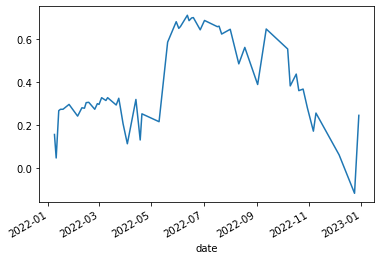

In [104]:
df.loc["NDVI",7].dropna().plot()

In [18]:
results

{'2018_0': {'_raw_lgbm_4_0': [88.8030888030888, 88.89085552152878],
  'raw_rf_4_0': [88.03088803088804, 88.02807888729059],
  '_raw_lgbm_4_1': [87.64478764478764, 87.52274728349997],
  'raw_rf_4_1': [86.10038610038609, 86.03170230786495],
  '_raw_lgbm_4_2': [90.73359073359073, 90.48010807944142],
  'raw_rf_4_2': [86.10038610038609, 85.75777743479607],
  '_raw_lgbm_4_3': [88.37209302325581, 88.5370437426369],
  'raw_rf_4_3': [88.37209302325581, 88.35042248494241],
  '_raw_lgbm_4_4': [89.92248062015504, 89.80748602085016],
  'raw_rf_4_4': [87.59689922480621, 87.07281759290466],
  '_syn_raw_lgbm_4_0': [53.28185328185329, 42.38777885394427],
  'syn_raw_rf_4_0': [41.6988416988417, 27.3998481655847],
  '_syn_raw_lgbm_4_1': [49.034749034749034, 39.159613408869234],
  'syn_raw_rf_4_1': [40.54054054054054, 25.531253869446292],
  '_syn_raw_lgbm_4_2': [67.95366795366795, 61.982818073072565],
  'syn_raw_rf_4_2': [39.768339768339764, 26.26613262127281],
  '_syn_raw_lgbm_4_3': [51.93798449612403, 43

In [17]:
y_preds = []
for pred in results[year][0][f1[1:].split(".")[0]+'_proba'][0]:
    y_preds.append(np.argmax(pred))

KeyError: '2022'

In [98]:
metrics.f1_score(y_test, y_pred, average='weighted'), metrics.f1_score(y_test, y_preds, average='weighted')

(0.899906723128812, 0.899906723128812)

In [89]:
df.loc[:,set(df.keys())-set(df.loc[sorted_dates[:n_dates*len(bands)]].dropna(axis=1, how="all").keys())]

Empty DataFrame
Columns: []
Index: [(B01, 2022-01-02 00:00:00), (B01, 2022-01-03 00:00:00), (B01, 2022-01-04 00:00:00), (B01, 2022-01-05 00:00:00), (B01, 2022-01-06 00:00:00), (B01, 2022-01-07 00:00:00), (B01, 2022-01-08 00:00:00), (B01, 2022-01-09 00:00:00), (B01, 2022-01-10 00:00:00), (B01, 2022-01-11 00:00:00), (B01, 2022-01-12 00:00:00), (B01, 2022-01-13 00:00:00), (B01, 2022-01-14 00:00:00), (B01, 2022-01-15 00:00:00), (B01, 2022-01-16 00:00:00), (B01, 2022-01-17 00:00:00), (B01, 2022-01-18 00:00:00), (B01, 2022-01-19 00:00:00), (B01, 2022-01-20 00:00:00), (B01, 2022-01-21 00:00:00), (B01, 2022-01-22 00:00:00), (B01, 2022-01-23 00:00:00), (B01, 2022-01-24 00:00:00), (B01, 2022-01-25 00:00:00), (B01, 2022-01-26 00:00:00), (B01, 2022-01-27 00:00:00), (B01, 2022-01-28 00:00:00), (B01, 2022-01-29 00:00:00), (B01, 2022-01-30 00:00:00), (B01, 2022-01-31 00:00:00), (B01, 2022-02-01 00:00:00), (B01, 2022-02-02 00:00:00), (B01, 2022-02-03 00:00:00), (B01, 2022-02-04 00:00:00), (B01, 2022-02-05 00:00:00), (B01, 2022-02-06 00:00:00), (B01, 2022-02-07 00:00:00), (B01, 2022-02-08 00:00:00), (B01, 2022-02-09 00:00:00), (B01, 2022-02-10 00:00:00), (B01, 2022-02-11 00:00:00), (B01, 2022-02-12 00:00:00), (B01, 2022-02-13 00:00:00), (B01, 2022-02-14 00:00:00), (B01, 2022-02-15 00:00:00), (B01, 2022-02-16 00:00:00), (B01, 2022-02-17 00:00:00), (B01, 2022-02-18 00:00:00), (B01, 2022-02-19 00:00:00), (B01, 2022-02-20 00:00:00), (B01, 2022-02-21 00:00:00), (B01, 2022-02-22 00:00:00), (B01, 2022-02-23 00:00:00), (B01, 2022-02-24 00:00:00), (B01, 2022-02-25 00:00:00), (B01, 2022-02-26 00:00:00), (B01, 2022-02-27 00:00:00), (B01, 2022-02-28 00:00:00), (B01, 2022-03-01 00:00:00), (B01, 2022-03-02 00:00:00), (B01, 2022-03-03 00:00:00), (B01, 2022-03-04 00:00:00), (B01, 2022-03-05 00:00:00), (B01, 2022-03-06 00:00:00), (B01, 2022-03-07 00:00:00), (B01, 2022-03-08 00:00:00), (B01, 2022-03-09 00:00:00), (B01, 2022-03-10 00:00:00), (B01, 2022-03-11 00:00:00), (B01, 2022-03-12 00:00:00), (B01, 2022-03-13 00:00:00), (B01, 2022-03-14 00:00:00), (B01, 2022-03-15 00:00:00), (B01, 2022-03-16 00:00:00), (B01, 2022-03-17 00:00:00), (B01, 2022-03-18 00:00:00), (B01, 2022-03-19 00:00:00), (B01, 2022-03-20 00:00:00), (B01, 2022-03-21 00:00:00), (B01, 2022-03-22 00:00:00), (B01, 2022-03-23 00:00:00), (B01, 2022-03-24 00:00:00), (B01, 2022-03-25 00:00:00), (B01, 2022-03-26 00:00:00), (B01, 2022-03-27 00:00:00), (B01, 2022-03-28 00:00:00), (B01, 2022-03-29 00:00:00), (B01, 2022-03-30 00:00:00), (B01, 2022-03-31 00:00:00), (B01, 2022-04-01 00:00:00), (B01, 2022-04-02 00:00:00), (B01, 2022-04-03 00:00:00), (B01, 2022-04-04 00:00:00), (B01, 2022-04-05 00:00:00), (B01, 2022-04-06 00:00:00), (B01, 2022-04-07 00:00:00), (B01, 2022-04-08 00:00:00), (B01, 2022-04-09 00:00:00), (B01, 2022-04-10 00:00:00), (B01, 2022-04-11 00:00:00), ...]

[5068 rows x 0 columns]

In [45]:
import pickle

with open("results_lgbm.pkl", "wb") as f:
    pickle.dump(results, f)

In [34]:
results[year+f"_{f1[1]}"]

KeyError: '2018_a'

In [46]:
results#[year+f"_{names_id[f1]}"]

{'2018_0': {'_raw_lgbm_4_0': [88.8030888030888, 88.89085552152878],
  'raw_rf_4_0': [88.03088803088804, 88.02807888729059],
  '_raw_lgbm_4_1': [87.64478764478764, 87.52274728349997],
  'raw_rf_4_1': [86.10038610038609, 86.03170230786495],
  '_raw_lgbm_4_2': [90.73359073359073, 90.48010807944142],
  'raw_rf_4_2': [86.10038610038609, 85.75777743479607],
  '_raw_lgbm_4_3': [88.37209302325581, 88.5370437426369],
  'raw_rf_4_3': [88.37209302325581, 88.35042248494241],
  '_raw_lgbm_4_4': [89.92248062015504, 89.80748602085016],
  'raw_rf_4_4': [87.59689922480621, 87.07281759290466],
  '_syn_raw_lgbm_4_0': [53.28185328185329, 42.38777885394427],
  'syn_raw_rf_4_0': [41.6988416988417, 27.3998481655847],
  '_syn_raw_lgbm_4_1': [49.034749034749034, 39.159613408869234],
  'syn_raw_rf_4_1': [40.54054054054054, 25.531253869446292],
  '_syn_raw_lgbm_4_2': [67.95366795366795, 61.982818073072565],
  'syn_raw_rf_4_2': [39.768339768339764, 26.26613262127281],
  '_syn_raw_lgbm_4_3': [51.93798449612403, 43

In [54]:
import numpy as np
import pandas as pd

# Define the mapping dictionaries
data_type_map = {'raw': 0, 'syn_raw': 1, 'sg': 2}
model_map = {'LGBM': 0, 'RF': 1}
calculation_type_map = {'monthly': 0, 'full TS': 1}

# Initialize the summary and count arrays
summary_array = np.zeros((len(data_type_map), len(model_map), len(calculation_type_map)))
count_array = np.zeros((len(data_type_map), len(model_map), len(calculation_type_map)))

# Iterate through the results dictionary
for year_fold, inner_dict in results.items():
    year = int(year_fold.split('_')[0])
    fold = int(year_fold.split('_')[1])

    for inner_key, scores in inner_dict.items():
        # Extract data type, model, and calculation type from the inner key
        parts = inner_key.split('_')
        if len(parts) >= 4:  # Ensure the key has enough parts
            data_type = parts[1]  # e.g., 'raw', 'syn_raw'
            model = parts[2].upper()  # e.g., 'LGBM', 'RF'
            calculation_type = 'monthly' if parts[3] != '0' else 'full TS'

            # Check if the data type, model, and calculation type are in the mapping dictionaries
            if data_type in data_type_map and model in model_map and calculation_type in calculation_type_map:
                # Get the score at index 1
                score = scores[1]

                # Add the score to the summary array and increment the count
                summary_array[data_type_map[data_type], model_map[model], calculation_type_map[calculation_type]] += score
                count_array[data_type_map[data_type], model_map[model], calculation_type_map[calculation_type]] += 1

# Calculate the final averages, handling division by zero
summary_array = np.divide(summary_array, count_array, out=np.zeros_like(summary_array), where=count_array != 0)

# Create the summary DataFrame
summary_df = pd.DataFrame(index=data_type_map.keys(), columns=['monthly LGBM', 'monthly RF', 'full TS LGBM', 'full TS RF'])

# Fill the DataFrame with the values from the summary array
for data_type in data_type_map:
    for model in model_map:
        for calculation_type in calculation_type_map:
            column_name = f"{calculation_type} {model}"
            summary_df.loc[data_type, column_name] = summary_array[data_type_map[data_type], model_map[model], calculation_type_map[calculation_type]]

print(summary_df)

        monthly LGBM monthly RF full TS LGBM full TS RF
raw        89.047648  64.806285          0.0  80.096589
syn_raw          0.0        0.0          0.0        0.0
sg               0.0        0.0          0.0        0.0


In [52]:
year_fold

'2022_4'

In [55]:
#new
names_id = dict((j,i) for i,j in enumerate(data_names))
results_mat = np.zeros((len(years), len(data_names)))
for y, year in enumerate(years):
    for f1 in files:
        f1 = f1[1:].split(".")[0]
        results_mat[y, names_id[f1]]=np.around(results[year+f"_{names_id[f1]}"], 1)

fig, ax = plt.subplots()
im = ax.imshow(results_mat.T)

# Show all ticks and label them with the respective list entries
ax.set_yticks(np.arange(len(data_names)))
ax.set_yticklabels(labels=data_names)
ax.set_xticks(np.arange(len(years)))
ax.set_xticklabels(years)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(data_names)):
    for j in range(len(years)):
        text = ax.text(j, i, results_mat[j, i],
                       ha="center", va="center", color="w")

ax.set_title("Test on random split, F1 weighted score\nNDVI for all available images.")
fig.tight_layout()
#plt.savefig("images/rand_all_fy/all_bands_ndvi_F1.pdf", dpi=300)# box_inches='tight'

TypeError: unsupported operand type(s) for *: 'dict' and 'float'

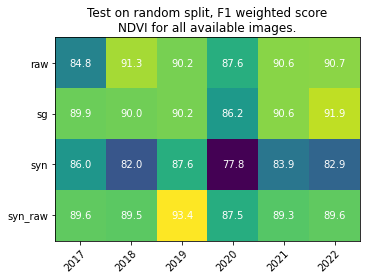

In [17]:
df_results["full TS LGBM"] = results_mat.mean(axis=0)
print(bands)
df_results

['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B10', 'B11', 'B12']


,monthly LGBM,monthly RF,full TS LGBM
raw,86.816667,86.816667,89.516667
sg,85.566667,85.566667,87.500000
syn,81.016667,81.016667,84.400000
syn_raw,81.950000,81.950000,89.633333


In [14]:
df_results["full TS LGBM"] = results_mat.mean(axis=0)
print(bands)
df_results

['NDVI']


,monthly LGBM,monthly RF,full TS LGBM
raw,70.183333,71.266667,85.350000
sg,67.250000,67.766667,73.366667
syn,62.433333,63.583333,71.183333
syn_raw,63.933333,62.816667,80.400000


In [27]:
df_results["full TS LGBM"] = results_mat.mean(axis=0)
print(bands)
df_results

['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B10', 'B11', 'B12', 'NDVI']


,monthly LGBM,monthly RF,full TS LGBM
raw,86.116667,83.733333,89.200000
sg,86.150000,83.166667,89.800000
syn,81.850000,79.550000,83.366667
syn_raw,82.666667,80.416667,89.816667
